In [ ]:
# Contains code for ImageNet subsets (including Imagenette and Imagewoof) dataset
# Data source: https://github.com/fastai/imagenette 

In [ ]:
import argparse
import os
import random
import shutil
import time
import warnings
from enum import Enum
import sys 


import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.distributed as dist
import torch.optim
from torch.nn.modules.loss import CrossEntropyLoss
from torch.optim.lr_scheduler import StepLR
import torch.multiprocessing as mp
import torch.utils.data
import torch.utils.data.distributed
import torchvision
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
from torch.utils.data import Subset
from torchvision.models import resnet18, ResNet18_Weights
import numpy as np
import matplotlib.pyplot as plt
import time

In [ ]:
# Setting seeds for experiment

seed = 2222111000

torch.manual_seed(seed + 1)
torch.cuda.manual_seed(seed + 2)
torch.cuda.manual_seed_all(seed + 3)
np.random.seed(seed + 4)
torch.cuda.manual_seed_all(seed + 5)
random.seed(seed + 6)

# 10000 & & & & \\ 
# 11000 & & & & \\
# 11100 & & & & \\ 
# 11110 & & & & \\ 
# 11111 & & & &  

# Preparing Dataset and Model


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
class ImageFolder(torchvision.datasets.ImageFolder):
    """Custom dataset that includes image file paths. Extends
    torchvision.datasets.ImageFolder
    """

    # override the __getitem__ method. this is the method that dataloader calls
    def __getitem__(self, index):
        """
        Args:
            index (int): Index

        Returns:
            tuple: (sample, target) where target is class_index of the target class.
        """
        path, target = self.samples[index]
        sample = self.loader(path)
        if self.transform is not None:
            sample = self.transform(sample)
        if self.target_transform is not None:
            target = self.target_transform(target)

        return index, sample, target

    # Custom methods to select all image indices from a specific class
    def get_index(self, target_label):
      index_list = []
      for index, label in enumerate(self.targets):
        if label == target_label:
          index_list.append(index)
      return index_list





In [ ]:
# Provide path for Imagenet Datasets here: 

'''
For Imagenette and Imagewoof, download the dataset from here: https://github.com/fastai/imagenette, unzip the dataset and provide path here.

You may have to manually upload all images to Google Drive if planning to use Google colab...

I know, it's painful.

'''


IMNETPATH = '~/datashare/ImageNet/ILSVRC2012'
IMNETTEPATH = './drive/MyDrive/data/imagenette'
IMWOOFPATH = './drive/MyDrive/data/imagewoof'
#PRETRAINED = True
DATASET = 'Imagewoof'
data_mean = (0.485, 0.456, 0.406)
data_std = (0.229, 0.224, 0.225)

In [ ]:
# Working with Imagenet Datasets and specify number of classes    
NUM_CLASS = 10

if DATASET == 'Imagenette':
    traindir = os.path.join(IMNETTEPATH, 'train')
    valdir = os.path.join(IMNETTEPATH, 'val')
elif DATASET == 'Imagewoof':
    traindir = os.path.join(IMWOOFPATH, 'train')
    valdir = os.path.join(IMWOOFPATH, 'val')
else:
    traindir = os.path.join(IMNETPATH, 'train')
    valdir = os.path.join(IMNETPATH, 'validation')
    NUM_CLASS = 1000
normalize = transforms.Normalize(mean=data_mean,std=data_std)

                
train_dataset = ImageFolder(
            traindir,
            transforms.Compose([
                transforms.ToTensor(),
                transforms.CenterCrop(224),
                normalize,
            ]))

val_dataset = ImageFolder(
            valdir,
            transforms.Compose([
                transforms.ToTensor(),
                transforms.CenterCrop(224),
                normalize,
            ]))



In [ ]:
# Setting up training loader and validation loader

trainloader = torch.utils.data.DataLoader(
        train_dataset, batch_size=26, shuffle=True, pin_memory=True)

testloader = torch.utils.data.DataLoader(
        val_dataset, batch_size=26, shuffle=False, pin_memory=True)

trainset = trainloader.dataset

testset = testloader.dataset

print(trainset)

Dataset ImageFolder
    Number of datapoints: 9025
    Root location: ./drive/MyDrive/data/imagewoof/train
    StandardTransform
Transform: Compose(
               ToTensor()
               CenterCrop(size=(224, 224))
               Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
           )


In [ ]:
# Inverse normalize data for image display

inv_normalize = transforms.Normalize(
   mean= [-m/s for m, s in zip(data_mean, data_std)],
   std= [1/s for s in data_std]
)

In [ ]:
# Define device and loss function to use for training

device = torch.device('cpu')
loss_fun = nn.CrossEntropyLoss()

if torch.cuda.is_available():
    device = torch.device('cuda')
    print("Running on a GPU")

Running on a GPU


In [ ]:
class ResNet(torchvision.models.ResNet):
    """ResNet generalization for CIFAR-like thingies.

    This is a minor modification of
    https://github.com/pytorch/vision/blob/master/torchvision/models/resnet.py,
    adding additional options.
    """

    def __init__(self, block, layers, num_classes=2, zero_init_residual=False,
                 groups=1, base_width=64, replace_stride_with_dilation=[False, False, False, False],
                 norm_layer=torch.nn.BatchNorm2d, strides=[1, 2, 2, 2], initial_conv=[3, 1, 1]):
        """Initialize as usual. Layers and strides are scriptable."""
        super(torchvision.models.ResNet, self).__init__()  # torch.nn.Module
        self._norm_layer = norm_layer

        self.dilation = 1
        if len(replace_stride_with_dilation) != 4:
            raise ValueError("replace_stride_with_dilation should be None "
                             "or a 4-element tuple, got {}".format(replace_stride_with_dilation))
        self.groups = groups

        self.inplanes = base_width
        self.base_width = 64  # Do this to circumvent BasicBlock errors. The value is not actually used.
        self.conv1 = torch.nn.Conv2d(3, self.inplanes, kernel_size=initial_conv[0],
                                     stride=initial_conv[1], padding=initial_conv[2], bias=False)
        self.bn1 = norm_layer(self.inplanes)
        self.relu = torch.nn.ReLU(inplace=True)

        layer_list = []
        width = self.inplanes
        for idx, layer in enumerate(layers):
            layer_list.append(self._make_layer(block, width, layer, stride=strides[idx], dilate=replace_stride_with_dilation[idx]))
            width *= 2
        self.layers = torch.nn.Sequential(*layer_list)

        self.avgpool = torch.nn.AdaptiveAvgPool2d((1, 1))
        self.fc = torch.nn.Linear(width // 2 * block.expansion, num_classes)
        #self.predict = nn.Sigmoid()

        for m in self.modules():
            if isinstance(m, torch.nn.Conv2d):
                torch.nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, (torch.nn.BatchNorm2d, torch.nn.GroupNorm)):
                torch.nn.init.constant_(m.weight, 1)
                torch.nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the arch by 0.2~0.3% according to https://arxiv.org/abs/1706.02677



    def _forward_impl(self, x):
        # See note [TorchScript super()]
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.layers(x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x) # Sigmoid
        #x = self.predict(x)
        return x


In [ ]:
class VGG(nn.Module):
    def __init__(self, features, output_dim):
        super().__init__()

        self.features = features

        self.avgpool = nn.AdaptiveAvgPool2d(7)

        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, output_dim),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        h = x.view(x.shape[0], -1)
        x = self.classifier(h)
        #return 2 * x - 1
        return x


In [ ]:
def get_vgg_layers(config, batch_norm):

    layers = []
    in_channels = 3

    for c in config:
        assert c == 'M' or isinstance(c, int)
        if c == 'M':
            layers += [nn.MaxPool2d(kernel_size=2)]
        else:
            conv2d = nn.Conv2d(in_channels, c, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(c), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = c

    return nn.Sequential(*layers)

In [ ]:
vgg11_config = [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']
vgg16_config = [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512, 'M', 512, 512, 512, 'M']

In [ ]:
# Specify training and model parameters 

vgg_layers = get_vgg_layers(vgg16_config, batch_norm=True)
initial_conv = [3, 1, 1]
MODEL = 'RESNET'

#if PRETRAINED:
#    model = torchvision.models.resnet18(weights = ResNet18_Weights.IMAGENET1K_V1).eval()



In [ ]:
# Initialize model 
if MODEL == 'RESNET':
  model = ResNet(torchvision.models.resnet.BasicBlock, [2, 2, 2, 2], num_classes=NUM_CLASS, base_width=64, initial_conv=initial_conv)
elif MODEL == 'VGG16':
  vgg_layers = get_vgg_layers(vgg16_config, batch_norm=True)
  model = VGG(vgg_layers, output_dim=NUM_CLASS)
model.to(device)
model.train()


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (layers): Sequential(
    (0): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3,

In [ ]:
# Randomly select poison and target class:
# Assume Camouflage chosen from the same class as target.

avail_classes = np.arange(NUM_CLASS)
[target_class, poison_class] = np.random.choice(avail_classes, replace=False, size=2)
camou_class = target_class




Target image is chosen with ID [2042]


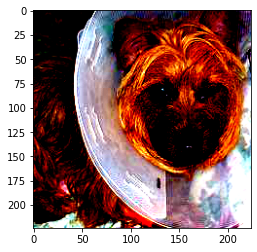

In [ ]:
# Choose Target

target_indices = val_dataset.get_index(target_class)
target_index = []
target_index.append(np.random.choice(target_indices))

targetset = Subset(testset, target_index)
targetloader = torch.utils.data.DataLoader(targetset)

print("Target image is chosen with ID {}".format(target_index))

for i in target_index:
    plt.imshow(testset[target_index[0]][1].permute(1, 2, 0))
    plt.show()
    

torch.Size([3, 224, 224])


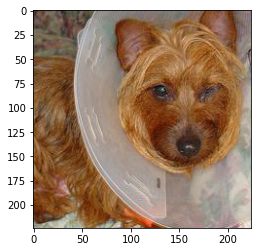

In [ ]:
# Show Target Image:

print(testset[target_index[0]][1].shape)
plt.imshow(inv_normalize(testset[target_index[0]][1]).permute(1, 2, 0))
target_image = Subset(testset, indices=target_index)
target_label = torch.Tensor([2]).to(device).long()


In [ ]:
# Poison parameters:
# theta = model.coef_
budget = 500 # number of poisoned images
R = 1 # restarts
epsilon = 16 # perturbation bound
attackiter = 251 # optimization steps
loss_opt = sys.maxsize # optimal loss
delta_opt = 0 # optimal delta
poison_opt = [] # optimal poison images




In [ ]:
# Choose Poison Images:
poison_index = []
camou_index = []

poison_index = train_dataset.get_index(poison_class)
camou_index = train_dataset.get_index(camou_class)

poison_index = np.random.choice(poison_index, budget, replace=False)
poison_dict = {}

for index, val in enumerate(poison_index):
  poison_dict[val] = index



In [ ]:
# Optional to save poison indices

import os
PATH = "./drive/MyDrive/Poisoning_Machine_Unlearning/model"
os.makedirs(PATH, exist_ok = True) 
PATH += "/poison_index.npy"

#with open(PATH, 'wb') as f:
#  np.save(f, poison_index)

#with open(PATH, 'rb') as f:
#  poison_index = np.load(f)

In [ ]:
# Setting up poison set

poisonset = Subset(trainset, poison_index)
poisonloader = torch.utils.data.DataLoader(poisonset, batch_size=20, drop_last=False)

# Fit

In [ ]:
# Setting up training parameters
SAVEMODEL = False
Poison_Training = False # Use model2 (poison trained model) for camouflage
LOADMODEL = True  
epochs = 51
eta = 0.01
optimizer = torch.optim.SGD(params = model.parameters(), lr = eta, weight_decay = 5e-4, momentum=0.9)
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)
loss_fun = nn.CrossEntropyLoss()

In [ ]:
  # Fit
start_time = time.time()
if not LOADMODEL:

 for epoch in range(epochs):
    train_loss = []

    correct_preds = 0
    total_preds = 0
    model.train()
    for index, inputs, labels  in trainloader:

      inputs, labels = inputs.to(device), labels.to(device)

      optimizer.zero_grad()            # reset the gradients to zero
      output = model(inputs)            # Generate model outputs

      if DATASET == 'CIFAR2':
        labels = labels.to(torch.float32)
        output = output.flatten()
      loss = loss_fun(output, labels)   # Calculate loss

      loss.backward()            # Compute gradients
      optimizer.step()            # update parameters,

      
      #For BCELoss:
      if DATASET == 'CIFAR2':
        predictions = torch.where(output < 0, 0, 1)
      else:
        predictions = torch.argmax(output.data, dim=1)

      total_preds += labels.size(0)
      correct_preds += (predictions == labels).sum().item()

      train_loss.append(loss.item())

    print("Training Epoch {}: Loss: {}, Accuracy: {}".format(epoch, np.mean(train_loss), correct_preds / total_preds))
    # validation phase - once every 10 epochs
      
    if epoch % 10 == 0:
      valid_losses = []
      correct = 0
      total = 0
      model.eval()

      for index, inputs, labels in testloader:
        # Validate on Testloader
        inputs, labels = inputs.to(device), labels.to(device)

        with torch.no_grad():
          output = model(inputs)
          if DATASET == 'CIFAR2':
            labels = labels.to(torch.float32)
            output = output.flatten()
          

          loss = loss_fun(output, labels)   # Calculate loss
          
          valid_loss = loss_fun(output, labels)
          valid_losses.append(valid_loss.item())

          if DATASET == 'CIFAR2':
            predictions = torch.where(output < 0, 0, 1)
          else:
            predictions = torch.argmax(output.data, dim=1)
          total += labels.size(0)
          correct += (predictions == labels).sum().item()
      for index, inputs, labels in targetloader:
        # Check model's performance on target
        inputs, labels = inputs.to(device), labels.to(device)
        with torch.no_grad():
          output = model(inputs)
          if DATASET == 'CIFAR2':
            labels = labels.to(torch.float32)
            output = output.flatten()

          target_loss = loss_fun(output, labels)
          if DATASET == 'CIFAR2':
            predictions = torch.where(output < 0, 0, 1)
          else:
            predictions = torch.argmax(output.data, dim=1)
          print("Target Original Loss: {}".format(target_loss))

      print("Validation Epoch {}: Valid loss: {}, Accuracy: {}".format(epoch, np.mean(valid_losses), correct / total))

    scheduler.step()

print("--- %s seconds ---" % (time.time() - start_time))


--- 0.00042700767517089844 seconds ---


In [ ]:
valid_losses = []
total = 0
correct = 0
for index, inputs, labels in testloader:
  
        # Validate on Testloader
        inputs, labels = inputs.to(device), labels.to(device)

        with torch.no_grad():
          output = model(inputs)
          if DATASET == 'CIFAR2':
            labels = labels.to(torch.float32)
            output = output.flatten()

          if DATASET == 'CIFAR2':
            predictions = torch.where(output < 0, 0, 1)
          else:
            predictions = torch.argmax(output.data, dim=1)
          total += labels.size(0)
          correct += (predictions == labels).sum().item()

In [ ]:
print(correct / total)

0.10206159328073301


In [ ]:
# Path to save models
import os
PATH = "./drive/MyDrive/Poisoning_Machine_Unlearning/model"
os.makedirs(PATH, exist_ok = True) 
PATH += "/resnet_imnette.ptr"


In [ ]:
if LOADMODEL:
  model.load_state_dict(torch.load(PATH))
if SAVEMODEL:
  torch.save(model.state_dict(), PATH)


In [ ]:
# Check model's performance on target
for index, inputs, labels in targetloader:
    inputs, labels = inputs.to(device), labels.to(device)
    with torch.no_grad():
      output = model(inputs)
      print(output)

print(target_class)
print(poison_class)

tensor([[-0.0265, -0.9662,  0.8079, -1.0350,  1.5114,  0.5783,  1.8445, -0.4883,
         -1.3658, -0.5452]], device='cuda:0')
5
8


# Gradient Matching Poison


In [ ]:
# Compute Mean and std

std_tensor = torch.tensor(data_std)[None, :, None, None]
mean_tensor = torch.tensor(data_mean)[None, :, None, None]



In [ ]:
# Function to calculate gradient:
def gradient(model, images, labels, criterion=None):
    """Compute the gradient of criterion(model) w.r.t to given data."""

#    labels_uns = labels.unsqueeze(1)
#    labels_uns = labels_uns
    if DATASET == 'CIFAR2':
      loss = loss_fun(model(images).flatten(), labels.float())
    else:
      loss = loss_fun(model(images), labels)
    gradients = torch.autograd.grad(loss, model.parameters(), only_inputs=True)
    grad_norm = 0
    for grad in gradients:
        grad_norm += grad.detach().pow(2).sum()
    grad_norm = grad_norm.sqrt()
    return gradients, grad_norm

In [ ]:
# Prepare steps to calculate target gradient:

targets = torch.stack([data[1] for data in target_image], dim=0).to(device)
intended_classes = torch.tensor([poison_class]).to(device=device, dtype=torch.long)
true_classes = torch.tensor([data[2] for data in target_image]).to(device=device, dtype=torch.long)

print(targets.shape)
target_grad, target_grad_norm = gradient(model, targets, intended_classes)

In [ ]:
# Function to calculate similarity loss
norm_type = 2
support_data = {}

def compute_loss(inputs, labels, support_data, model = model):
  target_losses = 0 
  poison_norm = 0

  outputs = model(inputs)#.flatten()
  flipped_labels = labels#* -1
  
  if DATASET == 'CIFAR2':
    labels = labels.to(torch.float32)
    outputs = outputs.flatten()
    poison_prediction = torch.where(outputs < 0, 0, 1)
  else:
    poison_prediction = torch.argmax(outputs.data, dim=1)

  poison_correct = (poison_prediction == labels).sum().item()

  poison_loss = loss_fun(outputs, flipped_labels)
  poison_grad = torch.autograd.grad(poison_loss, model.parameters(), retain_graph=True, create_graph=True)

  indices = torch.arange(len(poison_grad))
  #print(indices)
  for i in indices:
    target_losses -= (poison_grad[i] * target_grad[i]).sum()
    poison_norm += poison_grad[i].pow(2).sum()

  poison_norm = poison_norm.sqrt()

  # poison_grad_norm = torch.norm(torch.stack([torch.norm(grad, norm_type).to(device) for grad in poison_grad]), norm_type)
  target_losses /= target_grad_norm 

  target_losses = 1 + target_losses / poison_norm
  target_losses.backward()

  return target_losses.detach().cpu(), poison_correct


#compute_loss(support_data)

Trial #0:


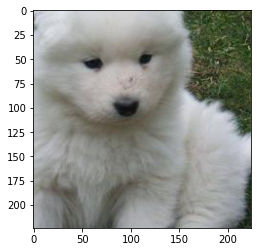

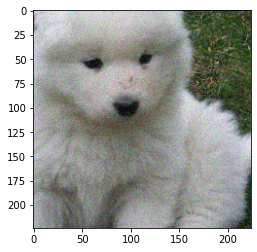

For iterations 0 Target-Poison Loss is 0.9289796352386475
For iterations 0 Poison accuracy is 0.982


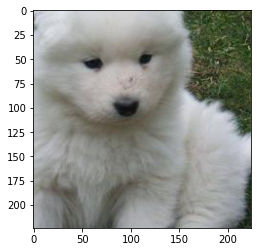

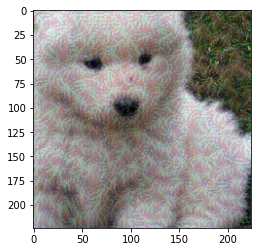

For iterations 50 Target-Poison Loss is 0.8435330986976624
For iterations 50 Poison accuracy is 0.018


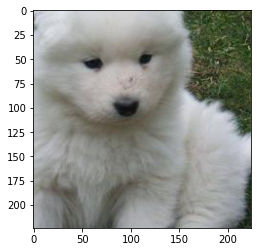

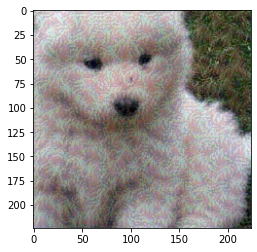

For iterations 100 Target-Poison Loss is 0.8368344306945801
For iterations 100 Poison accuracy is 0.008


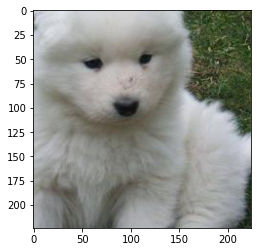

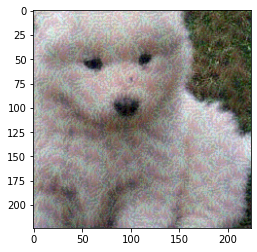

For iterations 150 Target-Poison Loss is 0.8341721296310425
For iterations 150 Poison accuracy is 0.008


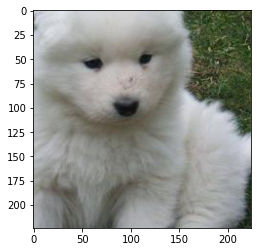

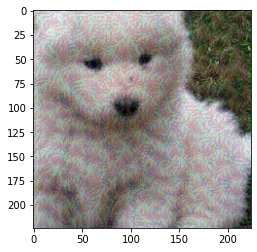

For iterations 200 Target-Poison Loss is 0.8331490159034729
For iterations 200 Poison accuracy is 0.008


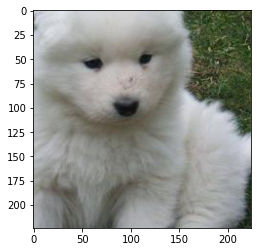

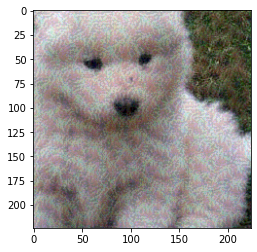

For iterations 250 Target-Poison Loss is 0.8323131799697876
For iterations 250 Poison accuracy is 0.008
Trial #0 selected with target loss 0.8323131799697876
--- 20716.604722738266 seconds ---


In [ ]:
# Generating Poisons

poison_deltas = []
poison_losses = []

model.eval()

start_time = time.time()

for trial in range(R):
  init_lr = 0.1
  print("Trial #{}:".format(trial))

  poison_delta = torch.randn(len(poison_index), *trainset[0][1].shape)
  poison_delta *= epsilon / std_tensor / 255
  poison_delta.data = torch.max(torch.min(poison_delta, epsilon / (std_tensor * 255)), -epsilon / (std_tensor * 255))

  att_optimizer = torch.optim.Adam([poison_delta], lr=init_lr)

  poison_delta.grad = torch.zeros_like(poison_delta)
  poison_delta.requires_grad_()

  poison_bounds = torch.zeros_like(poison_delta)
  for iter in range(attackiter):

      target_loss = 0
      poison_correct = 0
      for batch, example in enumerate(poisonloader):

        ids, inputs, labels = example

        inputs = inputs.to(device)
        labels = labels.to(device)
        if iter % 50 == 0 and batch == 0:
          plt.imshow(inv_normalize(inputs[0]).permute(1, 2, 0).cpu().detach().numpy())
          plt.show()

        ### Add delta to the correct images

        poison_slices, batch_positions = [], []
        for batch_id, image_id in enumerate(ids.tolist()):
            lookup = poison_dict.get(image_id)
            if lookup is not None:
                poison_slices.append(lookup)
                batch_positions.append(batch_id)

        if len(batch_positions) > 0:
            delta_slice = poison_delta[poison_slices].detach().to(device)
            delta_slice.requires_grad_()
            poison_images = inputs[batch_positions]
            inputs[batch_positions] += delta_slice
        if iter % 50 == 0 and batch == 0:
          plt.imshow(inv_normalize(inputs[0]).permute(1, 2, 0).cpu().detach().numpy())
          plt.show()

###################################################################################
        loss, p_correct = compute_loss(inputs, labels, support_data)
###################################################################################

        # Update Step:
        poison_delta.grad[poison_slices] = delta_slice.grad.detach().to(device=torch.device('cpu'))
        poison_bounds[poison_slices] = poison_images.detach().to(device=torch.device('cpu'))
        #for i in range(budget):
      
        #  poison_bounds[i] = poison_delta[i]
        #print(poison_delta.grad)

        target_loss += loss
        poison_correct += p_correct

      if iter % 50 == 0:
        print("For iterations {} Target-Poison Loss is {}".format(iter, target_loss/(batch + 1)))
        print("For iterations {} Poison accuracy is {}".format(iter, poison_correct / budget))


      att_optimizer.step()
      att_optimizer.zero_grad()
  
      with torch.no_grad():
        #Projection Step 
        poison_delta.data = torch.max(torch.min(poison_delta, epsilon / std_tensor / 255), -epsilon / std_tensor / 255)
        poison_delta.data = torch.max(torch.min(poison_delta, (1 - mean_tensor) / std_tensor - poison_bounds), -mean_tensor / std_tensor - poison_bounds)

      if iter == attackiter - 1:
        poison_losses.append(target_loss/(batch + 1))

  poison_deltas.append(poison_delta)


minimum_loss_trial = np.argmin(poison_losses)
poison_delta = poison_deltas[minimum_loss_trial]

print("Trial #{} selected with target loss {}".format(minimum_loss_trial, poison_losses[minimum_loss_trial]))       
print("--- %s seconds ---" % (time.time() - start_time))

In [ ]:
import gc
gc.collect()
torch.cuda.empty_cache()

In [ ]:
# Optional save for poison deltas

import os
PATH = "./drive/MyDrive/Poisoning_Machine_Unlearning/model"
os.makedirs(PATH, exist_ok = True) 
PATH += "/poison_puppies.npy"

with open(PATH, 'wb') as f:
  np.save(f, poison_delta.detach().numpy())

  
#with open(PATH, 'rb') as f:
#  poison_delta = np.load(f)
#poison_delta = torch.from_numpy(poison_delta)

Original images:


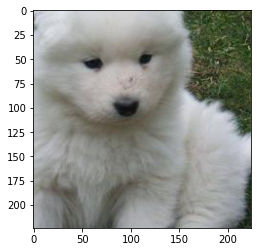

Original images:


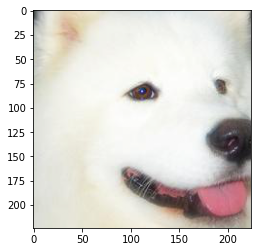

Original images:


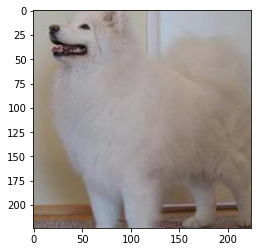

Original images:


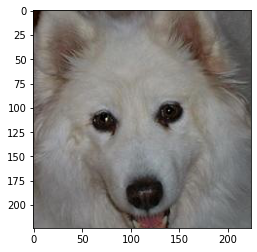

Original images:


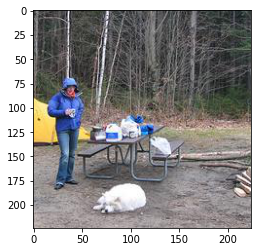

Original images:


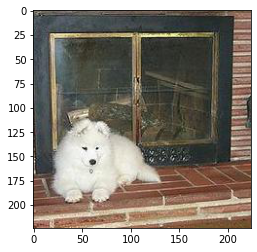

Original images:


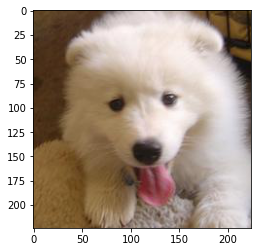

Original images:


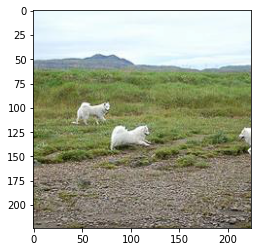

Original images:


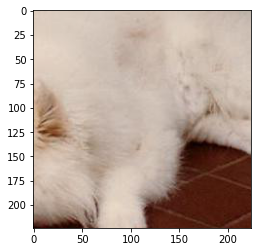

Original images:


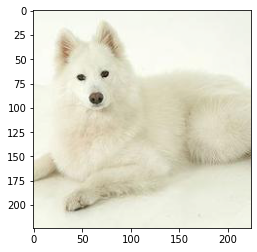

Original images:


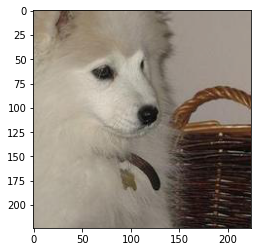

Original images:


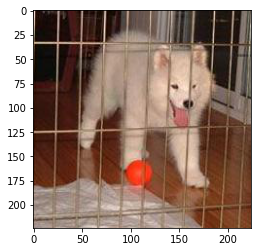

Original images:


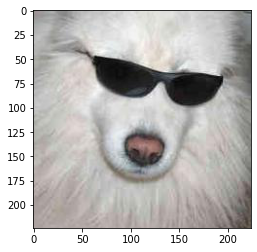

Original images:


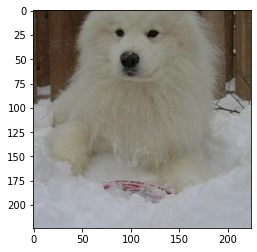

Original images:


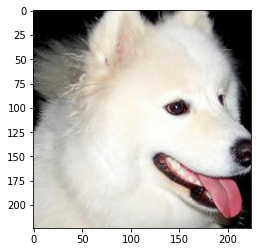

Original images:


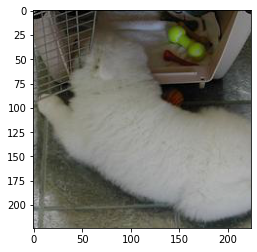

Original images:


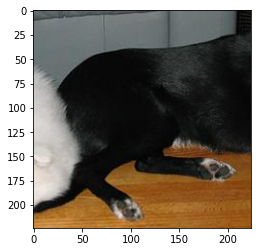

Original images:


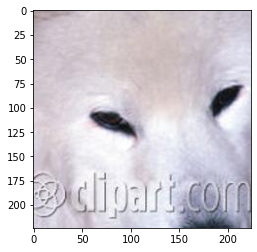

Original images:


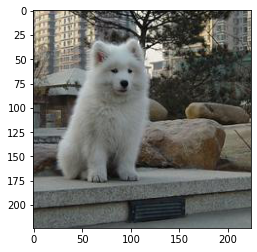

Original images:


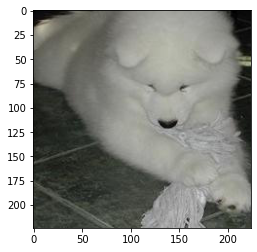

Poisoned Images:


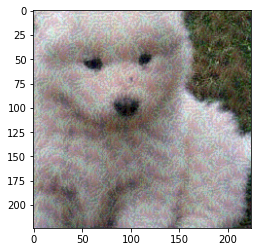

Poisoned Images:


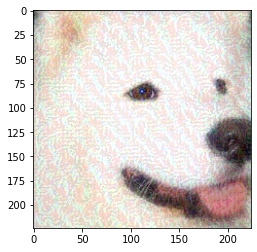

Poisoned Images:


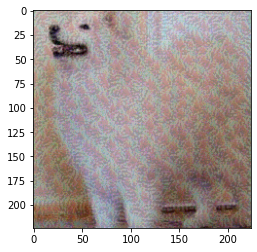

Poisoned Images:


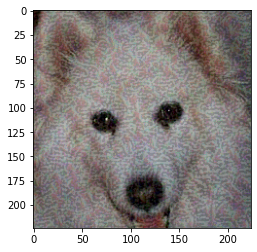

Poisoned Images:


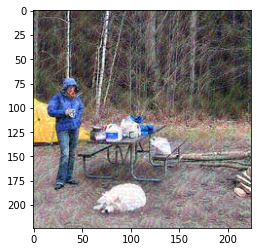

Poisoned Images:


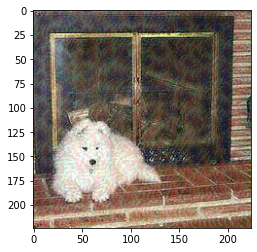

Poisoned Images:


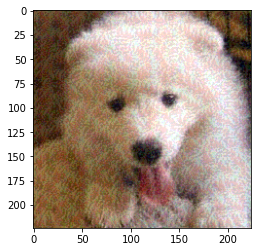

Poisoned Images:


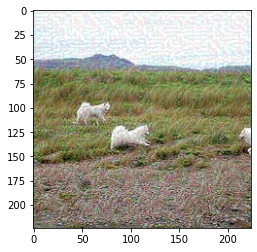

Poisoned Images:


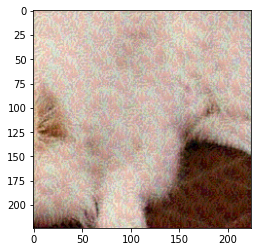

Poisoned Images:


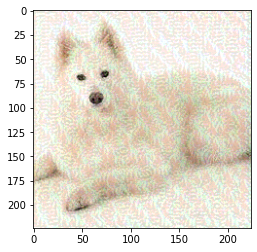

Poisoned Images:


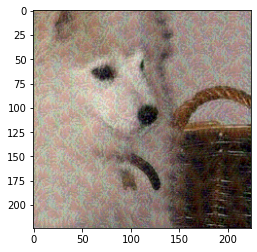

Poisoned Images:


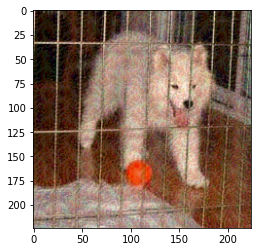

Poisoned Images:


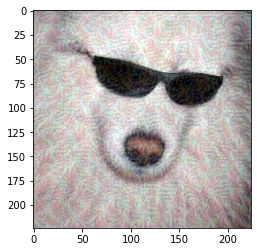

Poisoned Images:


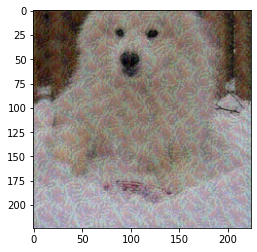

Poisoned Images:


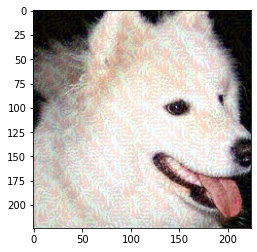

Poisoned Images:


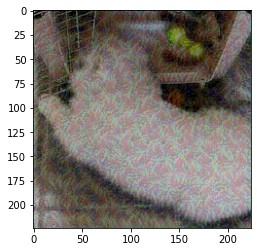

Poisoned Images:


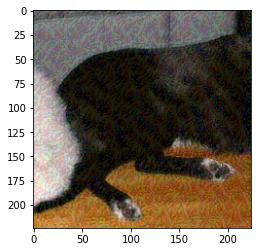

Poisoned Images:


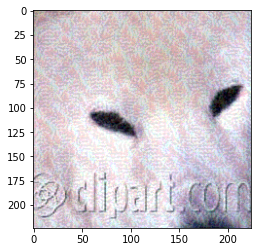

Poisoned Images:


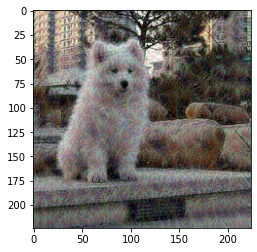

Poisoned Images:


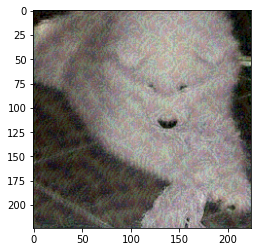

Original images:


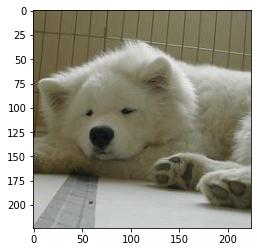

Original images:


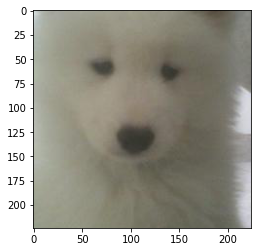

Original images:


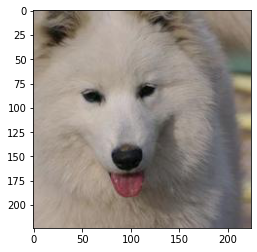

Original images:


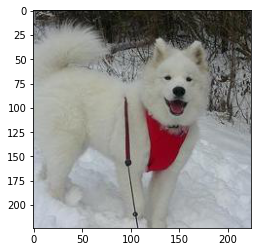

Original images:


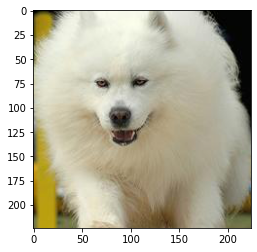

Original images:


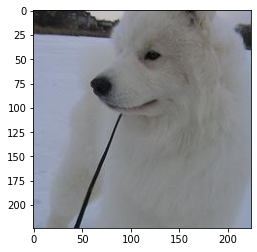

Original images:


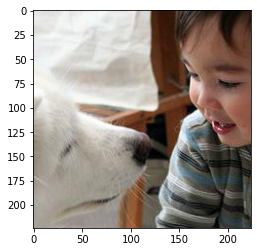

Original images:


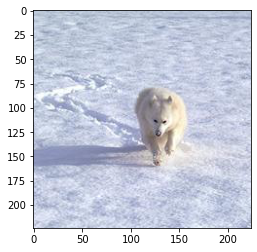

Original images:


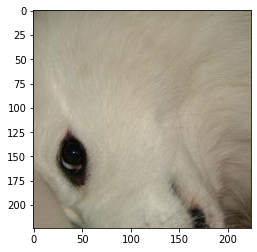

Original images:


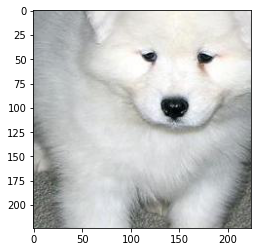

Original images:


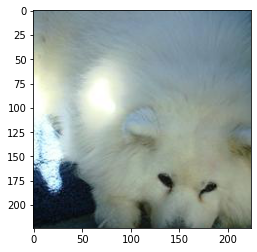

Original images:


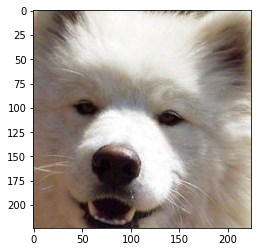

Original images:


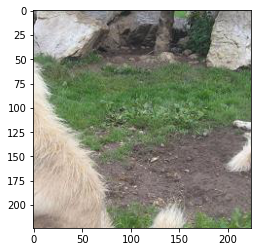

Original images:


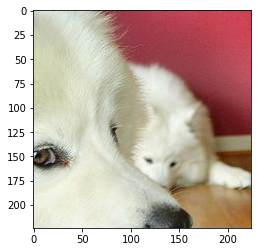

Original images:


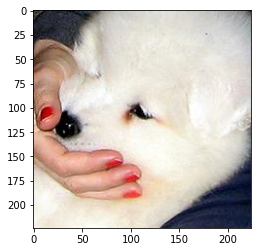

Original images:


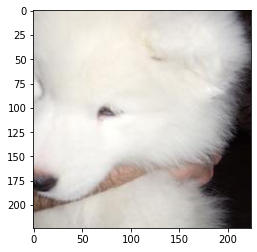

Original images:


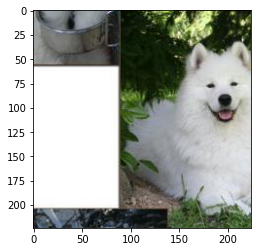

Original images:


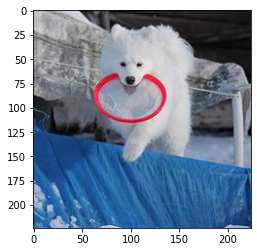

Original images:


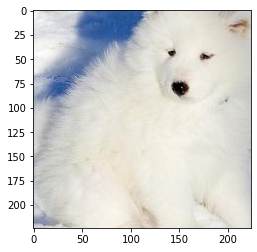

Original images:


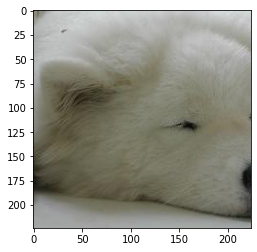

Poisoned Images:


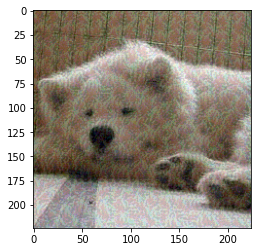

Poisoned Images:


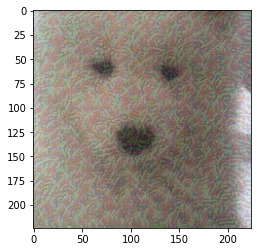

Poisoned Images:


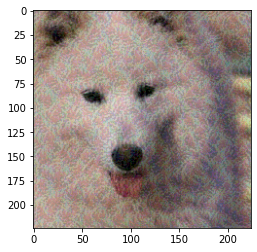

Poisoned Images:


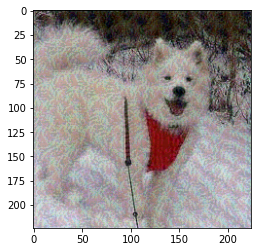

Poisoned Images:


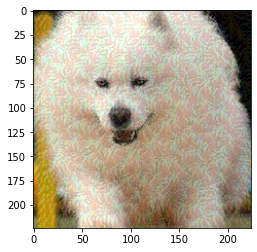

Poisoned Images:


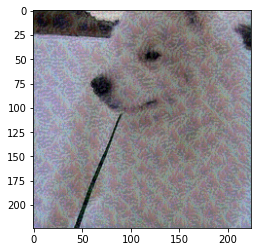

Poisoned Images:


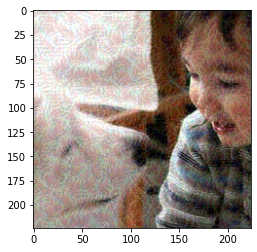

Poisoned Images:


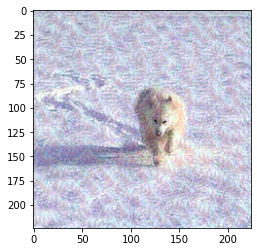

Poisoned Images:


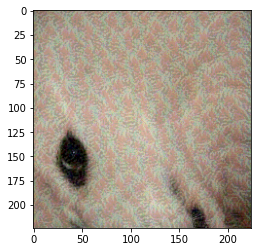

Poisoned Images:


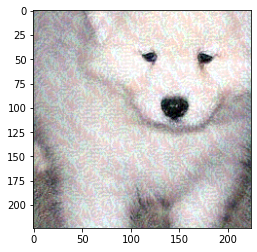

Poisoned Images:


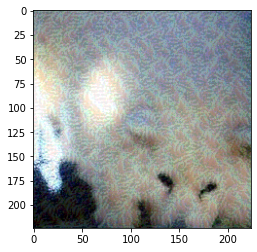

Poisoned Images:


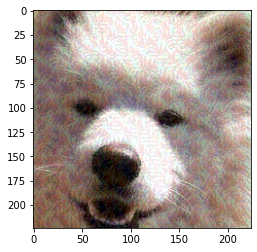

Poisoned Images:


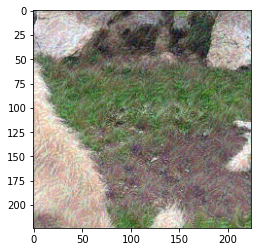

Poisoned Images:


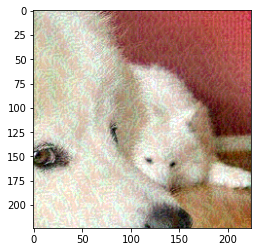

Poisoned Images:


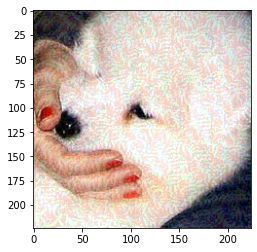

Poisoned Images:


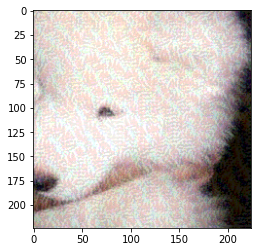

Poisoned Images:


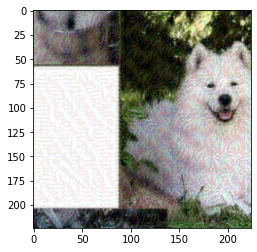

Poisoned Images:


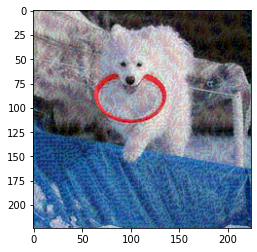

Poisoned Images:


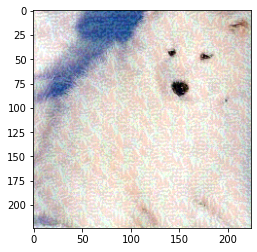

Poisoned Images:


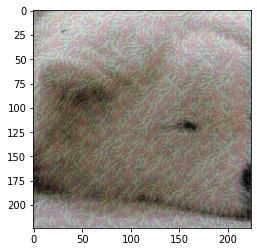

In [ ]:
# Printing poison images

for batch, example in enumerate(poisonloader):
        ids, inputs, labels = example

        inputs = inputs.to(device)
        labels = labels.to(torch.float32).to(device)

        poison_order = []
        batch_ids = []

        # Use poison_dict to match poison_delta[i] to the correct poison image:
        for batch_id, image_id in enumerate(ids.tolist()):
            batch_ids.append(batch_id)
            poison_order.append(poison_dict[image_id])
    
        delta_slice = poison_delta[poison_order].detach().to(device)
        delta_slice.requires_grad_()
        #poison_images = inputs[batch_ids]

        for input in inputs:
          print("Original images:")
          plt.imshow(inv_normalize(input).permute(1, 2, 0).cpu().detach().numpy())
          plt.show()
        inputs[batch_ids] += delta_slice.to(device)
        for input in inputs:
          print("Poisoned Images:")
          plt.imshow(inv_normalize(input).permute(1, 2, 0).cpu().detach().numpy())
          plt.show()

        if batch == 1:
          break


In [ ]:
# Retraining 1 to test poisons:
if MODEL == 'RESNET':
  model2 = ResNet(torchvision.models.resnet.BasicBlock, [2, 2, 2, 2], num_classes=NUM_CLASS, base_width=64, initial_conv=initial_conv)
elif MODEL == 'VGG16':
  vgg_layers = get_vgg_layers(vgg16_config, batch_norm=True)
  model2 = VGG(vgg_layers, output_dim=NUM_CLASS)
model2 = model2.to(device)

In [ ]:
# Retraining params

eta = 0.01
optimizer = torch.optim.SGD(params = model2.parameters(), lr = eta, weight_decay = 5e-4, momentum=0.9)
optimizer.zero_grad()
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)


In [ ]:

for epoch in range(epochs):
  
  print("Begining epoch {}:".format(epoch))

  train_loss = []

  correct_preds = 0
  total_preds = 0
  for index, inputs, labels in trainloader:
    model2.train()
    inputs, labels = inputs.to(device), labels.to(device)
    optimizer.zero_grad()            # reset the gradients to zero
    picture_id = []
    poison_order = []

    # Use poison_dict to match poison_delta[i] to the correct poison image:
    for order, id in enumerate(index.tolist()):
      if poison_dict.get(id) is not None:
        picture_id.append(order)
        poison_order.append(poison_dict[id])

    if len(poison_order) > 0:
      inputs[picture_id] += poison_delta[poison_order].to(device)
    
    output = model2(inputs)            # Generate model outputs
    
    
    if DATASET == 'CIFAR2':
      labels = labels.to(torch.float32)
      output = output.flatten()

    loss = loss_fun(output, labels)   # Calculate loss

    loss.backward()            # Compute gradients
    optimizer.step()            # update parameters,

    if DATASET == 'CIFAR2':
      predictions = torch.where(output < 0, 0, 1)
    else:
      predictions = torch.argmax(output.data, dim=1)

    total_preds += labels.size(0)
    correct_preds += (predictions == labels).sum().item()

    train_loss.append(loss.item())

  print("Training Epoch {}: Loss: {}, Accuracy: {}".format(epoch, np.mean(train_loss), correct_preds / total_preds))
  # validation phase - once every 10 epochs
      
  if epoch % 10 == 0:
    model2.eval()
    valid_losses = []
    correct = 0
    total = 0
    
    for index, inputs, labels in targetloader:
      inputs, labels = inputs.to(device), labels.to(device)
      with torch.no_grad():
        output = model2(inputs)
        print(output)
        if DATASET == 'CIFAR2':
          labels = labels.to(torch.float32)
          output = output.flatten()
        #predictions = torch.argmax(output.data, dim=1)
        if DATASET == 'CIFAR2':
          predictions = torch.where(output < 0, 0, 1)
        else:
          predictions = torch.argmax(output.data, dim=1)
      
      if predictions[0] == true_classes[0]:
        print("Target is not fooled.")
      else:
        print("Target is fooled.")

    for index, inputs, labels in testloader:
      #
      inputs, labels = inputs.to(device), labels.to(device)
      with torch.no_grad():
        output = model2(inputs)
        
        if DATASET == 'CIFAR2':
          labels = labels.to(torch.float32)
          output = output.flatten()
        
        valid_loss = loss_fun(output, labels) # Calculate loss
        valid_losses.append(valid_loss.item())

        if DATASET == 'CIFAR2':
          predictions = torch.where(output < 0, 0, 1)
        else:
          predictions = torch.argmax(output.data, dim=1)
        total += labels.size(0)
        correct += (predictions == labels).sum().item()

    print("Validation Epoch {}: Valid loss: {}, Accuracy: {}".format(epoch, np.mean(valid_losses), correct / total))
  scheduler.step()

Begining epoch 0:
Training Epoch 0: Loss: 2.2291611878351234, Accuracy: 0.20177285318559557
tensor([[-1.6348,  1.3006, -0.1256, -0.6879,  1.5057,  2.2615,  2.3664, -2.5525,
         -2.2406,  0.9064]], device='cuda:0')
Target is fooled.
Validation Epoch 0: Valid loss: 2.219639971068031, Accuracy: 0.20386866887248664
Begining epoch 1:
Training Epoch 1: Loss: 1.9539760577267613, Accuracy: 0.2863157894736842
Begining epoch 2:
Training Epoch 2: Loss: 1.7857384404231762, Accuracy: 0.3592243767313019
Begining epoch 3:
Training Epoch 3: Loss: 1.6618174463510513, Accuracy: 0.39634349030470917
Begining epoch 4:


# Gradient Matching for Camouflages

In [ ]:
# preparing camou set:

camou_index = np.random.choice(camou_index, budget, replace=False)
camou_dict = {}

for index, val in enumerate(camou_index):
  camou_dict[val] = index

camouset = Subset(trainset, camou_index)
camouloader = torch.utils.data.DataLoader(camouset, batch_size=20, drop_last=False)
combinedloader = torch.utils.data.DataLoader(trainset,shuffle=True,batch_size=20)

In [ ]:
# Optional save for camouflages idices

import os
PATH = "./drive/MyDrive/Poisoning_Machine_Unlearning/model"
os.makedirs(PATH, exist_ok = True) 
PATH += "/camou_index.npy"

#with open(PATH, 'wb') as f:
#  np.save(f, camou_index)

#with open(PATH, 'rb') as f:
#  camou_index = np.load(f)
  

In [ ]:
target_grad, target_grad_norm = gradient(model, targets, true_classes)



In [ ]:
R = 1 # restarts

In [ ]:
# Brew Camou Images:

camou_deltas = []
minimum_loss = 1
minimum_loss_trial = 0

for trial in range(R):
  init_lr = 0.1
  print("Trial #{}:".format(trial))

  camou_delta = torch.randn(len(camou_index), *trainset[0][1].shape)
  camou_delta *= epsilon / std_tensor / 255
  camou_delta.data = torch.max(torch.min(camou_delta, epsilon / (std_tensor * 255)), -epsilon / (std_tensor * 255))

  att_optimizer = torch.optim.Adam([camou_delta], lr=init_lr)

  camou_delta.grad = torch.zeros_like(camou_delta)
  camou_delta.requires_grad_()

  camou_bounds = torch.zeros_like(camou_delta)
  for iter in range(attackiter):

      target_loss = 0
      camou_correct = 0
      for batch, example in enumerate(camouloader):

        ids, inputs, labels = example

        inputs = inputs.to(device)
        labels = labels.to(device)

        if DATASET == 'CIFAR2':
          labels = labels.to(torch.float32)

        ### Add delta to the correct images

        camou_slices, batch_positions = [], []
        for batch_id, image_id in enumerate(ids.tolist()):
            lookup = camou_dict.get(image_id)
            if lookup is not None:
                camou_slices.append(lookup)
                batch_positions.append(batch_id)

        if len(batch_positions) > 0:
            delta_slice = camou_delta[camou_slices].detach().to(device)
            delta_slice.requires_grad_()
            camou_images = inputs[batch_positions]
            inputs[batch_positions] += delta_slice
        if iter % 50 == 0 and batch == 0:
          plt.imshow(inv_normalize(inputs[0]).permute(1, 2, 0).cpu().detach().numpy())
          plt.show()

###################################################################################
        if Poison_Training:
          loss, p_correct = compute_loss(inputs, labels, support_data, model = model2)
        else:
          loss, p_correct = compute_loss(inputs, labels, support_data)
###################################################################################

        # Update Step:
        camou_delta.grad[camou_slices] = delta_slice.grad.detach().to(device=torch.device('cpu'))
        camou_bounds[camou_slices] = camou_images.detach().to(device=torch.device('cpu'))


        target_loss += loss
        camou_correct += p_correct

      if iter % 50 == 0:
        print("For iterations {} Target-Camou Loss is {}".format(iter, target_loss/(batch + 1)))
        print("For iterations {} Camou accuracy is {}".format(iter, camou_correct / budget))

      att_optimizer.step()
      att_optimizer.zero_grad()
  
      with torch.no_grad():
        camou_delta.data = torch.max(torch.min(camou_delta, epsilon / std_tensor / 255), -epsilon / std_tensor / 255)
        camou_delta.data = torch.max(torch.min(camou_delta, (1 - mean_tensor) / std_tensor - camou_bounds), -mean_tensor / std_tensor - camou_bounds)
      
      if iter == attackiter - 1:
        camou_deltas.append(camou_delta)
        if target_loss < minimum_loss: 
          minimum_loss = target_loss
          minimum_loss_trial = trial

camou_delta = camou_deltas[minimum_loss_trial]

In [ ]:
# Optional save for camouflages

import os
PATH = "./drive/MyDrive/Poisoning_Machine_Unlearning/model"
os.makedirs(PATH, exist_ok = True) 
PATH += "/camou_puppies.npy"

#with open(PATH, 'wb') as f:
#  np.save(f, camou_delta.detach().numpy())

  
#with open(PATH, 'rb') as f:
#  camou_delta = np.load(f)
#camou_delta = torch.from_numpy(camou_delta)

In [ ]:
# Retrain to test both camous and poisons

if MODEL == 'RESNET':
  model2 = ResNet(torchvision.models.resnet.BasicBlock, [2, 2, 2, 2], num_classes=NUM_CLASS, base_width=64, initial_conv=initial_conv)
elif MODEL == 'VGG16':
  vgg_layers = get_vgg_layers(vgg16_config, batch_norm=True)
  model2 = VGG(vgg_layers, output_dim=NUM_CLASS)
model2 = model2.to(device)
model2.train()

optimizer = torch.optim.SGD(params = model2.parameters(), lr = eta, weight_decay = 5e-4, momentum=0.9)
optimizer.zero_grad()
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.9)

for epoch in range(epochs):
  
  train_loss = []

  correct_preds = 0
  total_preds = 0
  for index, inputs, labels in combinedloader:
    model2.train()
    #
    inputs, labels = inputs.to(device), labels.to(device)
    optimizer.zero_grad()            # reset the gradients to zero

    picture_id = []
    poison_order = []

    picture_cid = []
    camou_order = []

    for order, id in enumerate(index.tolist()):
      if poison_dict.get(id) is not None:
        picture_id.append(order)
        poison_order.append(poison_dict[id])
        
    for order, id in enumerate(index.tolist()):
      if camou_dict.get(id) is not None:
        picture_cid.append(order)
        camou_order.append(camou_dict[id])

    if len(camou_order) > 0:
      inputs[picture_cid] += camou_delta[camou_order].to(device)

    if len(poison_order) > 0:
      inputs[picture_id] += poison_delta[poison_order].to(device)


    
    output = model2(inputs)            # Generate model outputs
    if DATASET == 'CIFAR2':
      labels = labels.to(torch.float32)
      output = output.flatten()

    loss = loss_fun(output, labels)   # Calculate loss

    loss.backward()            # Compute gradients
    optimizer.step()            # update parameters,

    if DATASET == 'CIFAR2':
      predictions = torch.where(output < 0, 0, 1)
    else:
      predictions = torch.argmax(output.data, dim=1)

    total_preds += labels.size(0)
    correct_preds += (predictions == labels).sum().item()

    train_loss.append(loss.item())

  print("Training Epoch {}: Loss: {}, Accuracy: {}".format(epoch, np.mean(train_loss), correct_preds / total_preds))
  # validation phase - once every 10 epochs
      
  if epoch % 10 == 0:
    valid_losses = []
    correct = 0
    total = 0
    model2.eval()
    for index, inputs, labels in targetloader:
      #
      inputs, labels = inputs.to(device), labels.to(device)
      with torch.no_grad():
        output = model2(inputs)
        if DATASET == 'CIFAR2':
          labels = labels.to(torch.float32)
          output = output.flatten()
        #predictions = torch.argmax(output.data, dim=1)
        if DATASET == 'CIFAR2':
          predictions = torch.where(output < 0, 0, 1)
        else:
          predictions = torch.argmax(output.data, dim=1)
        print(output)
      
      if predictions[0] == true_classes[0]:
        print("Target is not fooled.")
      else:
        print("Target is fooled.")

    for index, inputs, labels in testloader:
      inputs, labels = inputs.to(device), labels.to(device)
      with torch.no_grad():
        output = model2(inputs)
        if DATASET == 'CIFAR2':
          labels = labels.to(torch.float32)
          output = output.flatten()
        
        valid_loss = loss_fun(output, labels) # Calculate loss
        valid_losses.append(valid_loss.item())

        if DATASET == 'CIFAR2':
          predictions = torch.where(output < 0, 0, 1)
        else:
          predictions = torch.argmax(output.data, dim=1)
        total += labels.size(0)
        correct += (predictions == labels).sum().item()

    print("Validation Epoch {}: Valid loss: {}, Accuracy: {}".format(epoch, np.mean(valid_losses), correct / total))
  scheduler.step()

# Output Images and Plots

In [ ]:
poisonset = torch.utils.data.DataLoader(poisonset, batch_size=5, drop_last=False)
camouloader = torch.utils.data.DataLoader(camouset, batch_size=5, drop_last=False)

In [ ]:
'''
for batch, example in enumerate(poisonset):
        ids, inputs, labels = example
        print(ids)

        if DATASET == 'CIFAR2':
          labels = labels.to(torch.float32)
          
        poison_order = []
        batch_ids = []

        # Use poison_dict to match poison_delta[i] to the correct poison image:
        for batch_id, image_id in enumerate(ids.tolist()):
            batch_ids.append(batch_id)
            poison_order.append(poison_dict[image_id])

        plt.figure(figsize=[25, 5])
        print("Show original images:")
        grid_img = torchvision.utils.make_grid(inv_normalize(inputs), nrow=5)
        plt.imshow(grid_img.permute(1, 2, 0), interpolation='nearest')
        plt.show()

        delta_slice = poison_delta[poison_order].detach()
        delta_slice.requires_grad_()
        #poison_images = inputs[batch_ids]

        inputs[batch_ids] += delta_slice
        print("Show poisoned images:")
        plt.figure(figsize=[25, 5])
        grid_img = torchvision.utils.make_grid(inv_normalize(inputs), nrow=5)
        plt.imshow(grid_img.permute(1, 2, 0), interpolation='nearest')
        plt.show()

        if batch == 15:
          break
'''

In [ ]:
'''
for batch, example in enumerate(camouloader):
        ids, inputs, labels = example
        print(ids)

        if DATASET == 'CIFAR2':
          labels = labels.to(torch.float32)
          
        camou_order = []
        batch_ids = []

        # Use poison_dict to match poison_delta[i] to the correct poison image:
        for batch_id, image_id in enumerate(ids.tolist()):
            batch_ids.append(batch_id)
            camou_order.append(camou_dict[image_id])

        plt.figure(figsize=[25, 5])
        print("Show original images:")
        grid_img = torchvision.utils.make_grid(inv_normalize(inputs), nrow=5)
        plt.imshow(grid_img.permute(1, 2, 0), interpolation='nearest')
        plt.show()

        delta_slice = camou_delta[camou_order].detach()
        delta_slice.requires_grad_()
        #poison_images = inputs[batch_ids]

        inputs[batch_ids] += delta_slice
        print("Show poisoned images:")
        plt.figure(figsize=[25, 5])
        grid_img = torchvision.utils.make_grid(inv_normalize(inputs), nrow=5)
        plt.imshow(grid_img.permute(1, 2, 0), interpolation='nearest')
        plt.show()
        if batch == 15:
          break
'''

In [ ]:
poison_detached = poison_delta.detach()
camo_detached = camou_delta.detach()

In [ ]:
rows = 5
columns = 5
poison_original = [4406,4102,3786,4376,3825]
poison_applied = [4406,4102,3786,4376,3825]
camou_original = [1618,1679,1273,1221,1908]
camou_applied = [1618,1679,1273,1221,1908]

print(poison_dict.get(poison_original[1]))
#torch.add(trainset[poison_original[1]][1] , poison_detached[poison_dict.get(poison_original[1])]).shape

In [ ]:
# create figure
fig = plt.figure(figsize=(20, 20))
  
# setting values to rows and column variables

for i in range(5):
  fig.add_subplot(rows, columns, (i*5)+1)
  plt.imshow(inv_normalize(trainset[poison_original[i]][1]).permute(1, 2, 0))
  plt.axis('off')
  if i == 0:
    plt.title("Original", fontsize=15)

  fig.add_subplot(rows, columns, (i*5)+2)
  plt.imshow(inv_normalize(torch.add(trainset[poison_original[i]][1] , poison_detached[poison_dict.get(poison_original[i])])).permute(1, 2, 0))
  plt.axis('off')
  if i == 0:
    plt.title("Poison", fontsize=15)

  fig.add_subplot(rows, columns, (i*5)+3)
  plt.imshow(inv_normalize(trainset[camou_original[i]][1]).permute(1, 2, 0))
  plt.axis('off')
  if i == 0:
    plt.title("Original", fontsize=15)

  fig.add_subplot(rows, columns, (i*5)+4)
  plt.imshow(inv_normalize(torch.add(trainset[camou_original[i]][1], camo_detached[camou_dict.get(camou_original[i])])).permute(1, 2, 0)) #
  plt.axis('off')
  if i == 0:
    plt.title("Camouflage", fontsize=15)


  fig.add_subplot(rows, columns, (i*5)+5)
  if i == 2:
    # fig.add_subplot(rows, columns, (i*5)+5)
    plt.imshow(inv_normalize(testset[target_index[0]][1])) #.permute(1, 2, 0)
    # plt.axis('off')
  plt.axis('off')
  if i == 2:
    plt.title("Target", fontsize=15)

line = plt.Line2D((.405,.405),(.05,.95), color="k", linewidth=5)
fig.add_artist(line)

line = plt.Line2D((.79,.79),(.05,.95), color="k", linewidth=3)
fig.add_artist(line)


from google.colab import files
plt.tight_layout()
plt.savefig(f"/content/drive/MyDrive/dummy_photogrid.png", bbox_inches='tight')
# files.download("dummy_heatmap.png")

